In [179]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot') # set style (colors, background, size, gridlines etc.) # ggplot
plt.rcParams['figure.figsize'] = 8, 4 # set default size of plots
plt.rcParams.update({'font.size': 18})

import scraping_class
logfile = 'log.txt' ## name your log file.
connector = scraping_class.Connector(logfile)

from bs4 import BeautifulSoup
from tqdm import tqdm_notebook as tqdm

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.model_selection import KFold
from sklearn.model_selection import validation_curve
from sklearn.metrics import r2_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve

In [10]:
x = pd.read_csv("inputInfo_X.csv")
y = pd.read_csv("inputInfo_Y.csv")

In [103]:
# define features to be dropped from given dataset
imdb_features = ['metascore', 'director_metascore', 'writer_metascore', 'tomatometer_score', 'director_tomatometer','writer_tomatometer', 'audience_score', 'director_audience', 'writer_audience']
meta_features = ['avg_vote', 'director_imdb', 'writer_imdb', 'tomatometer_score', 'director_tomatometer','writer_tomatometer', 'audience_score', 'director_audience', 'writer_audience']
tomato_features = ['avg_vote', 'director_imdb', 'writer_imdb', 'metascore', 'director_metascore', 'writer_metascore', 'audience_score', 'director_audience', 'writer_audience'] 
audience_features = ['avg_vote', 'director_imdb', 'writer_imdb', 'metascore', 'director_metascore', 'writer_metascore', 'tomatometer_score', 'director_tomatometer','writer_tomatometer']

In [104]:
# construct datasets for desired features
x_imdb = x.drop(imdb_features,axis=1)
x_meta = x.drop(meta_features,axis=1)
x_tometer = x.drop(tomato_features,axis=1)
x_audience = x.drop(audience_features,axis=1)

# select target
y_net = y['net_income']
y_wgi = y['adjusted_wgi']
y_norm = np.log(y_wgi) # log normalize

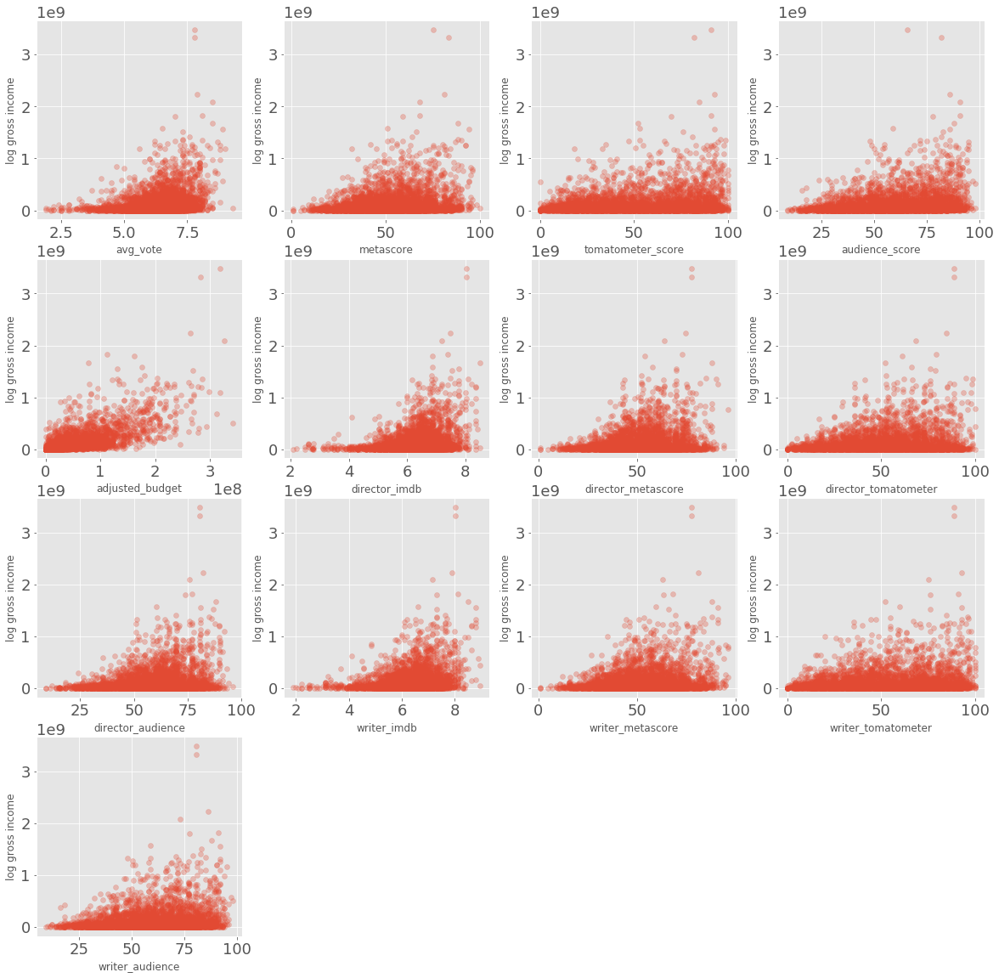

In [62]:
fig = plt.figure(figsize = (20, 25)) # create figure

for index, feature_name in enumerate(x.columns[:13]): # create scatterplot for each of the main features
    ax = fig.add_subplot(5, 4, index+1) 
    ax.scatter(x[feature_name], y_wgi, alpha=0.3) 
    ax.set_ylabel('log gross income', size = 12) 
    ax.set_xlabel(feature_name, size = 12) 
  
plt.show() 

Now we want to build a preliminary model to evaluate baseline performance of each of the datasets in a linear regression.

In [105]:
# split datasets into set for training and testing
X_train_imdb, X_test_imdb, y_train_imdb, y_test_imdb = train_test_split(x_imdb, y_norm, test_size=1/3, random_state=1)
X_train_meta, X_test_meta, y_train_meta, y_test_meta = train_test_split(x_meta, y_norm, test_size=1/3, random_state=1)
X_train_tometer, X_test_tometer, y_train_tometer, y_test_tometer = train_test_split(x_tometer, y_norm, test_size=1/3, random_state=1)
X_train_audience, X_test_audience, y_train_audience, y_test_audience = train_test_split(x_audience, y_norm, test_size=1/3, random_state=1)

In [106]:
def rmse(y_pred, y_true):
    return np.sqrt(mse(y_pred, y_true))

In [110]:
def lin_reg(X_train_,y_train_):
    lr = LinearRegression()
    lr.fit(X_train_, y_train_)

    pred_train_lr= lr.predict(X_train_)
    mse_ = mse(y_train_,pred_train_lr)
    r2_ = r2_score(y_train_, pred_train_lr)

    return mse_, r2_

In [111]:
imdb = lin_reg(X_train_imdb,y_train_imdb)
meta = lin_reg(X_train_meta,y_train_meta)
tomato = lin_reg(X_train_tometer,y_train_tometer)
audience = lin_reg(X_train_audience,y_train_audience)

In [112]:
print(imdb)
print(meta)
print(tomato)
print(audience)

(1.7302623412406883, 0.536392170088847)
(1.7521217709371502, 0.5246041097275127)
(1.7589405589493976, 0.5208966829758526)
(1.7062488491339722, 0.5491712602551099)


Now we try out different models for the **imdb** dataset and use this to select our model.

In [158]:
# splitting into development (2/3) and test data (1/3)
X_dev, X_test, y_dev, y_test = train_test_split(x_imdb, y_norm, test_size=1/3, random_state=1)

# splitting development into train (1/3) and validation (1/3)
X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=1/2, random_state=1)

Implement cross validation on Lasso model using K-fold method

In [261]:
kfolds = KFold(n_splits=5)
folds = list(kfolds.split(X_dev, y_dev))

lambdas =  np.logspace(-4, 6, 12) # set hyperparameter space

# outer loop: lambdas
mseCV_lasso = []
for lambda_ in tqdm(lambdas):    
    # inner loop: folds
    mseCV_ = []    
    for train_idx, val_idx in folds:        
        # train model and compute MSE on test fold
        pipe_lassoCV = make_pipeline(PolynomialFeatures(include_bias=False),
                                     StandardScaler(),
                                     Lasso(alpha=lambda_, random_state=1))            
        X_train, y_train = X_dev.iloc[train_idx], y_dev.iloc[train_idx]
        X_val, y_val = X_dev.iloc[val_idx], y_dev.iloc[val_idx] 
        pipe_lassoCV.fit(X_train, y_train)        
        mseCV_.append(mse(pipe_lassoCV.predict(X_val), y_val))    
        
    # store result    
    mseCV_lasso.append(mseCV_) 
    
# convert to DataFrame
lambdaCV_lasso = pd.DataFrame(mseCV_lasso, index=lambdas)

In [262]:
# choose optimal hyperparameters 
optimal_lambda_lasso = lambdaCV_lasso.mean(axis=1).nsmallest(1)

# retrain/re-estimate model using optimal hyperparameters
pipe_lassoCV = make_pipeline(PolynomialFeatures(), 
                             StandardScaler(),
                             Lasso(alpha=optimal_lambda_lasso.index[0], random_state=1))
pipe_lassoCV.fit(X_dev,y_dev)

Pipeline(memory=None,
         steps=[('polynomialfeatures',
                 PolynomialFeatures(degree=2, include_bias=True,
                                    interaction_only=False, order='C')),
                ('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('lasso',
                 Lasso(alpha=0.4328761281083057, copy_X=True,
                       fit_intercept=True, max_iter=1000, normalize=False,
                       positive=False, precompute=False, random_state=1,
                       selection='cyclic', tol=0.0001, warm_start=False))],
         verbose=False)

In [264]:
#score = mse(pipe_lassoCV.predict(X_test),y_test)
optimal_lambda_lasso
#pipe_lassoCV.score(X_dev,y_dev)
#lambdaCV

0.432876    4.264256
dtype: float64

Implement cross validation on Ridge model using K-fold method.

In [253]:
kfolds = KFold(n_splits=5)
folds = list(kfolds.split(X_dev, y_dev))

lambdas =  np.logspace(-4, 6, 12)

# outer loop: lambdas
mseCV_ridge = []
for lambda_ in tqdm(lambdas):    
    # inner loop: folds
    mseCV_ = []    
    for train_idx, val_idx in folds:        
        # train model and compute MSE on test fold
        pipe_ridgeCV = make_pipeline(PolynomialFeatures(include_bias=False),
                                     StandardScaler(),
                                     Ridge(alpha=lambda_, random_state=1))            
        X_train, y_train = X_dev.iloc[train_idx], y_dev.iloc[train_idx]
        X_val, y_val = X_dev.iloc[val_idx], y_dev.iloc[val_idx] 
        pipe_ridgeCV.fit(X_train, y_train)        
        mseCV_.append(mse(pipe_ridgeCV.predict(X_val), y_val))    
        
    # store result    
    mseCV_ridge.append(mseCV_) 
    
# convert to DataFrame
lambdaCV_ridge = pd.DataFrame(mseCV_ridge, index=lambdas)

In [254]:
# choose optimal hyperparameter
optimal_lambda_ridge = lambdaCV_ridge.mean(axis=1).nsmallest(1)

# retrain/re-estimate model using optimal hyperparameters
pipe_ridgeCV = make_pipeline(PolynomialFeatures(include_bias=False), 
                             StandardScaler(),
                             Ridge(alpha=optimal_lambda_ridge.index[0], random_state=1))
pipe_ridgeCV.fit(X_dev,y_dev)
score_ridge = mse(pipe_ridgeCV.predict(X_test),y_test)

In [260]:
optimal_lambda_ridge = lambdaCV_ridge.mean(axis=1)
#lambdaCV
#pipe_ridgeCV.score(X_dev, y_dev)
optimal_lambda_ridge
#score_ridge
#r2_score(pipe_ridgeCV.predict(y_test,X_test))

0.000100          65.016365
0.000811          52.912766
0.006579          38.514243
0.053367          18.826958
0.432876          13.036558
3.511192          10.497174
28.480359          8.826670
231.012970         9.323865
1873.817423        7.384413
15199.110830       5.692485
123284.673944      5.803525
1000000.000000     6.220122
dtype: float64

Having chosen the Ridge model as the optimal model, we now plot the learning curve and validation curve to visualize our machine learning process.

In [324]:
pipe_ridge = make_pipeline(PolynomialFeatures(include_bias=False), 
                             StandardScaler(),
                             Ridge(random_state=1))

pipe_lasso = make_pipeline(PolynomialFeatures(include_bias=False), 
                             StandardScaler(),
                             Lasso(random_state=1))

In [194]:
train_sizes, train_scores, test_scores = \
    learning_curve(estimator=pipe_ridge,
                   X=X_dev,
                   y=y_dev,
                   train_sizes=np.arange(0.2, 1.05, .05),
                   scoring='neg_mean_squared_error',                 
                   cv=5)
    
mse_ = pd.DataFrame({'Train':-train_scores.mean(axis=1),
                     'Test':-test_scores.mean(axis=1)})\
        .set_index(pd.Index(train_sizes,name='sample size'))
print(mse_.head(5))

Train         Test
sample size                       
464          0.225721  3476.295403
697          0.394964   893.481811
929          0.599575    30.127830
1162         0.724427    18.686902
1394         0.814486    26.253628


array([ 464,  697,  929, 1162, 1394, 1626, 1859, 2091])

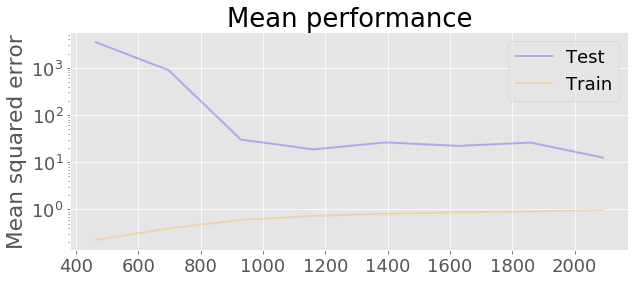

In [195]:
f_learn, ax = plt.subplots(figsize=(10,4))
ax.plot(train_sizes,-test_scores.mean(1), alpha=0.25, linewidth=2, label ='Test', color='blue')
ax.plot(train_sizes,-train_scores.mean(1),alpha=0.25, linewidth=2, label='Train', color='orange')

ax.set_title('Mean performance')
ax.set_ylabel('Mean squared error')
ax.set_yscale('log')
ax.legend()
plt.savefig('learn_bias.png')

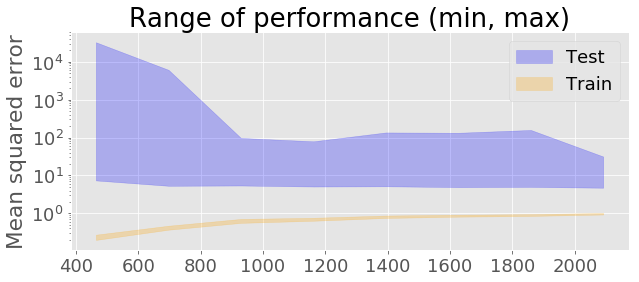

In [196]:
f_learn, ax = plt.subplots(figsize=(10,4))
ax.fill_between(train_sizes,
                -test_scores.min(1),
                -test_scores.max(1), 
                alpha=0.25, label ='Test', color='blue')

ax.fill_between(train_sizes,
                -train_scores.min(1),
                -train_scores.max(1), 
                alpha=0.25, label='Train', color='orange')

ax.set_title('Range of performance (min, max)')
ax.set_ylabel('Mean squared error')
ax.set_yscale('log')
ax.legend()

In [198]:
train_scores, test_scores = \
    validation_curve(estimator=pipe_ridge,
                     X=X_dev,
                     y=y_dev,
                     param_name='ridge__alpha',
                     param_range=lambdas,
                     scoring='neg_mean_squared_error',                 
                     cv=5)

mse_score = pd.DataFrame({'Train':-train_scores.mean(axis=1),
                          'Validation':-test_scores.mean(axis=1),
                          'lambda':lambdas})\
              .set_index('lambda')   
print(mse_score.Validation.nsmallest(1))

lambda
15199.11083    5.65571
Name: Validation, dtype: float64


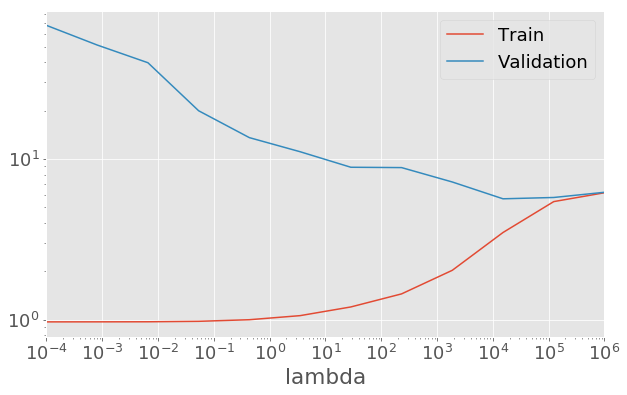

In [199]:
mse_score.plot(logx=True, logy=True, figsize=(10,6))

In [232]:
# choose optimal hyperparameters 
optimal_lambda_2 = mse_score.Validation.nsmallest(1)

# retrain/re-estimate model using optimal hyperparameters
pipe_ridgeCV_2 = make_pipeline(PolynomialFeatures(), 
                             StandardScaler(),
                             Ridge(alpha=optimal_lambda_2.index[0], random_state=1))
pipe_ridgeCV_2.fit(X_dev,y_dev)
score_ridge_2 = mse(pipe_ridgeCV.predict(X_test),y_test)

In [247]:
score_ridge_2
#optimal_lambda_2
pipe_ridgeCV_2.score(X_test,y_test)
#r2_score(y_test,pipe_ridgeCV.predict(X_dev))

0.3216743533328148

In [358]:
def learn_curve_lasso(data=x_imdb):
    # splitting into development (2/3) and test data (1/3)
    X_dev, X_test, y_dev, y_test = train_test_split(data, y_norm, test_size=1/3, random_state=1)

    # splitting development into train (1/3) and validation (1/3)
    X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=1/2, random_state=1)
    
    train_sizes, train_scores, test_scores = \
    learning_curve(estimator=pipe_lasso,
                   X=X_dev,
                   y=y_dev,
                   train_sizes=np.arange(0.2, 1.05, .05),
                   scoring='neg_mean_squared_error',                 
                   cv=5)
    
    mse_score = pd.DataFrame({'Train':-train_scores.mean(axis=1),
                     'Test':-test_scores.mean(axis=1)})\
                            .set_index(pd.Index(train_sizes,name='sample size'))

    return [train_sizes, train_scores, test_scores]


In [359]:
def learn_curve_ridge(data=x_imdb):
    
    # splitting into development (2/3) and test data (1/3)
    X_dev, X_test, y_dev, y_test = train_test_split(data, y_norm, test_size=1/3, random_state=1)

    # splitting development into train (1/3) and validation (1/3)
    X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=1/2, random_state=1)
    
    train_sizes, train_scores, test_scores = \
    learning_curve(estimator=pipe_ridge,
                   X=X_dev,
                   y=y_dev,
                   train_sizes=np.arange(0.2, 1.05, .05),
                   scoring='neg_mean_squared_error',                 
                   cv=5)

    return [train_sizes, train_scores, test_scores]

In [360]:
def val_curve_lasso(data=x_imdb):

    # splitting into development (2/3) and test data (1/3)
    X_dev, X_test, y_dev, y_test = train_test_split(data, y_norm, test_size=1/3, random_state=1)

    # splitting development into train (1/3) and validation (1/3)
    X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=1/2, random_state=1)
    
    validation_curve(estimator=pipe_lasso,
                     X=X_dev,
                     y=y_dev,
                     param_name='lasso__alpha',
                     param_range=lambdas,
                     scoring='neg_mean_squared_error',                 
                     cv=5)

    mse_score = pd.DataFrame({'Train':-train_scores.mean(axis=1),
                          'Validation':-test_scores.mean(axis=1),
                          'lambda':lambdas})\
                        .set_index('lambda')
              
    return mse_score

In [361]:
def val_curve_ridge(data=x_imdb):

    # splitting into development (2/3) and test data (1/3)
    X_dev, X_test, y_dev, y_test = train_test_split(data, y_norm, test_size=1/3, random_state=1)

    # splitting development into train (1/3) and validation (1/3)
    X_train, X_val, y_train, y_val = train_test_split(X_dev, y_dev, test_size=1/2, random_state=1)
    
    validation_curve(estimator=pipe_ridge,
                     X=X_dev,
                     y=y_dev,
                     param_name='ridge__alpha',
                     param_range=lambdas,
                     scoring='neg_mean_squared_error',                 
                     cv=5)

    mse_score = pd.DataFrame({'Train':-train_scores.mean(axis=1),
                          'Validation':-test_scores.mean(axis=1),
                          'lambda':lambdas})\
                        .set_index('lambda')
              
    return mse_score

In [314]:
#mse_scores_learn_lasso = []

#for x in [x_imdb,x_meta,x_tometer,x_audience]:
    #mse_scores_learn_lasso.append(learn_curve_lasso(x))

KeyboardInterrupt: 

In [300]:
#mse_scores_val_lasso = []

#for x in [x_imdb,x_meta,x_tometer,x_audience]:
    #mse_scores_val_lasso.append(val_curve_lasso(x))

In [363]:
mse_scores_learn_ridge = []

for x in tqdm([x_imdb,x_meta,x_tometer,x_audience]):
    mse_scores_learn_ridge.append(learn_curve_ridge(x))

In [394]:
mse_scores_val_ridge = []

for x in tqdm([x_imdb,x_meta,x_tometer,x_audience]):
   mse_scores_val_ridge.append(val_curve_ridge(x))

In [315]:
mse_scores_learn_lasso = mse_scores_learn_ridge.copy()


In [380]:
def plot_learning_curve_lasso(i):
    f_learn, ax = plt.subplots(figsize=(10,4))
    ax.plot(mse_scores_learn_lasso[i].index,mse_scores_learn_lasso[i].Test, alpha=0.25, linewidth=2, label ='Validation',             color='blue')
    ax.plot(mse_scores_learn_lasso[i].index,mse_scores_learn_lasso[i].Train, alpha=0.25, linewidth=2, label='Train',            color='orange')

    ax.set_title('Mean performance')
    ax.set_ylabel('Mean squared error')
    ax.set_yscale('log')
    ax.legend()
    plt.savefig(f'learn_lasso_{i}.png')

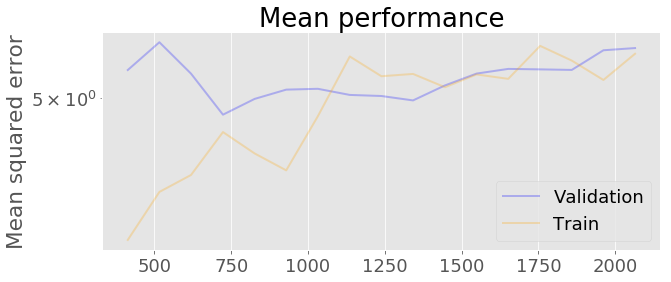

In [381]:
plot_learning_curve_lasso(0)

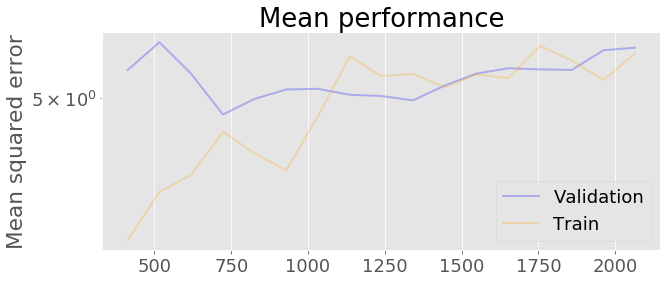

In [382]:
plot_learning_curve_lasso(1)

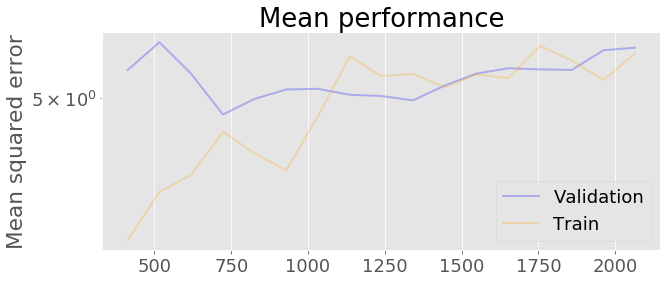

In [383]:
plot_learning_curve_lasso(2)

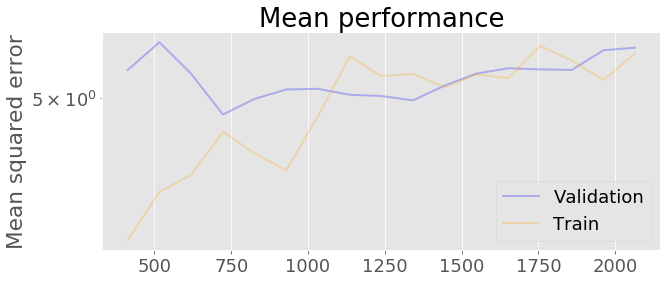

In [384]:
plot_learning_curve_lasso(3)

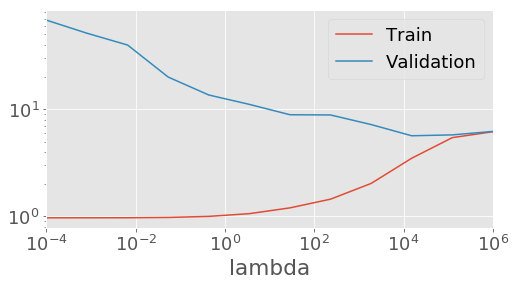

In [385]:
mse_scores_val_lasso[0].plot(logx=True, logy=True)
plt.savefig('val_lasso_0.png')
plt.show()

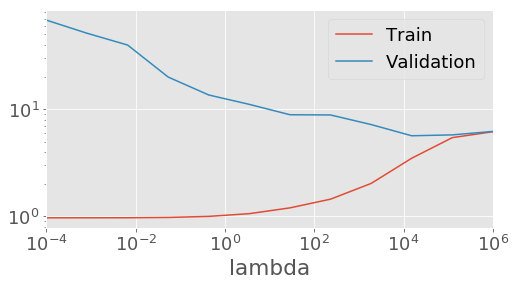

In [386]:
mse_scores_val_lasso[1].plot(logx=True, logy=True)
plt.savefig('val_lasso_1.png')
plt.show()

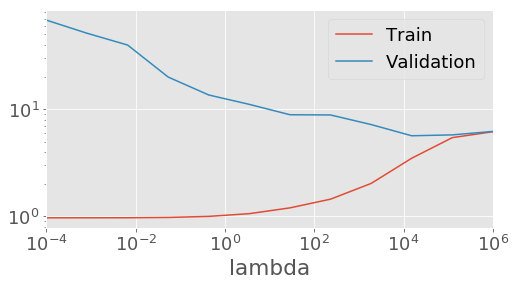

In [387]:
mse_scores_val_lasso[2].plot(logx=True, logy=True)
plt.savefig('val_lasso_2.png')
plt.show()

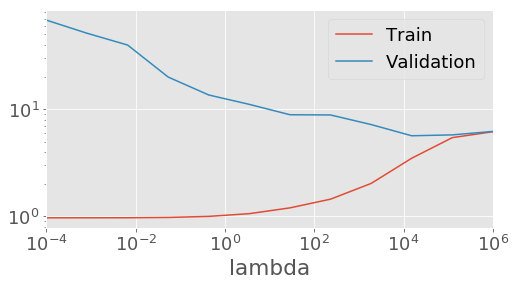

In [388]:
mse_scores_val_lasso[3].plot(logx=True, logy=True)
plt.savefig('val_lasso_3.png')
plt.show()

In [389]:
def plot_learning_curve_ridge(i):
    
    train_sizes, train_scores, test_scores = mse_scores_learn_ridge[i][0], mse_scores_learn_ridge[i][1], mse_scores_learn_ridge[i][2]
    f_learn, ax = plt.subplots(figsize=(10,4))
    ax.plot(train_sizes,-test_scores.mean(1), alpha=0.25, linewidth=2, label ='Validation', color='blue')
    ax.plot(train_sizes,-train_scores.mean(1),alpha=0.25, linewidth=2, label='Train', color='orange')

    ax.set_title('Mean performance')
    ax.set_ylabel('Mean squared error')
    ax.set_yscale('log')
    ax.legend()
    plt.savefig(f'learn_ridge_{i}.png')

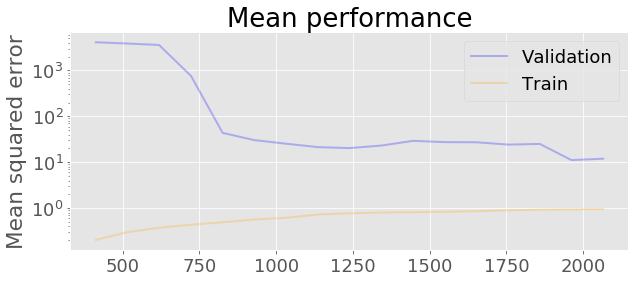

In [390]:
#mse_scores_learn_ridge[0]
plot_learning_curve_ridge(0)

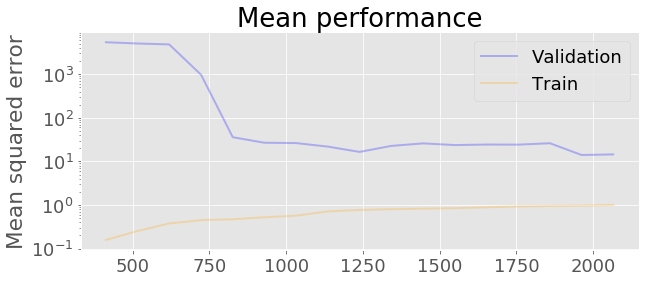

In [391]:
plot_learning_curve_ridge(1)

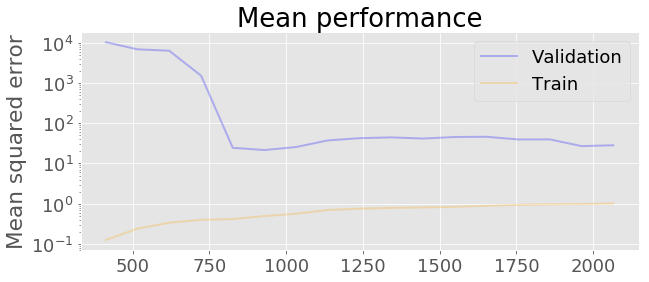

In [392]:
plot_learning_curve_ridge(2)

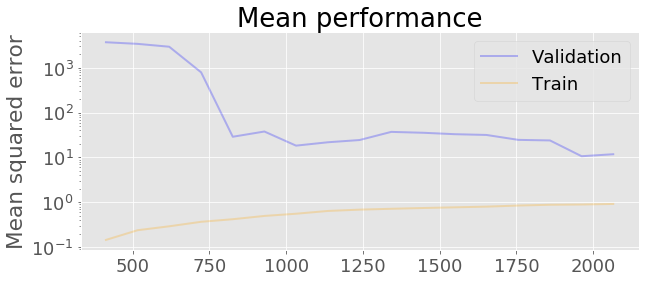

In [393]:
plot_learning_curve_ridge(3)

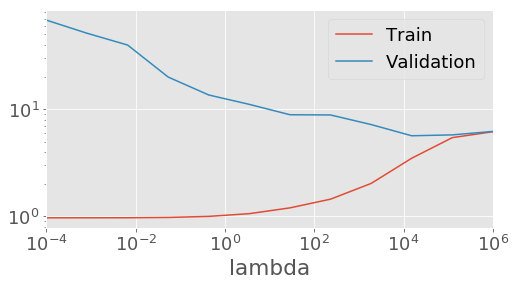

In [395]:
mse_scores_val_ridge[0].plot(logx=True, logy=True)
plt.savefig('val_ridge_0.png')
plt.show()

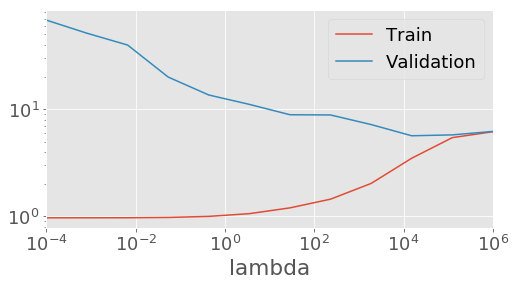

In [396]:
mse_scores_val_ridge[1].plot(logx=True, logy=True)
plt.savefig('val_ridge_1.png')
plt.show()

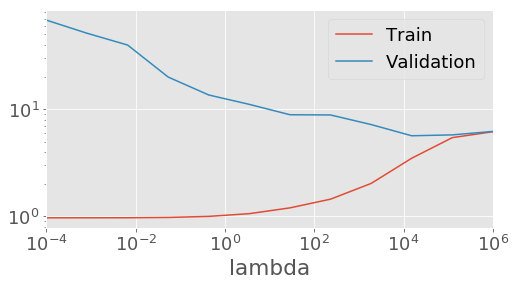

In [397]:
mse_scores_val_ridge[2].plot(logx=True, logy=True)
plt.savefig('val_ridge_2.png')
plt.show()

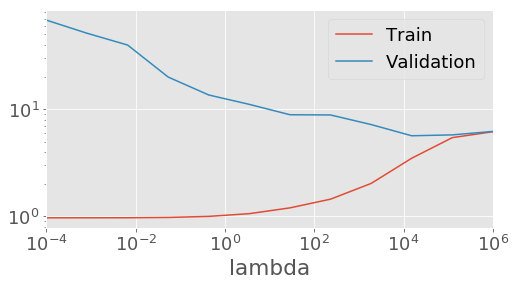

In [398]:
mse_scores_val_ridge[3].plot(logx=True, logy=True)
plt.savefig('val_ridge_3.png')
plt.show()

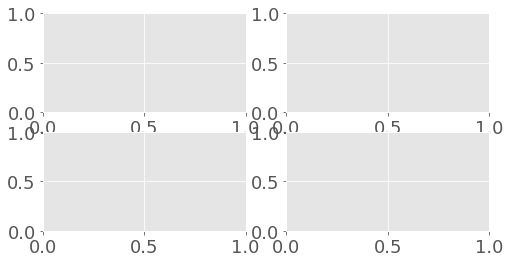

In [399]:
fig, ax = plt.subplots(2,2, figsize)